DEnsity based determination of cores, followed by determination of belonging score to each cluster. Use threshold to determine if gene is part or not

How to determine core?
- clique
- clustering coefficient

handle data:
- sparse matrix - current approach
- try with dictionary structure?

generate interaction matrix:
- for now a for loop
- probablz more efficient way to do this

use igraph?

overlapping cores??

right now hard threshold, as if sectioning 3d graph at certain spot. what about soft, depending on surrounding - look at local maxima

In [1]:
import igraph as ig
import pandas as pd
import numpy as np
from scipy.sparse import csr_matrix
from itertools import combinations
import seaborn as sns

path = "./files/"

In [5]:
def determine_cores(edge_list, cc_threshold=0.9, ndn=2):
    edge_df = pd.read_csv(path+edge_list, compression='infer').astype({'ProteinAid': 'str', 'ProteinBid':'str'})
    edge_df = edge_df[edge_df['PPV'] > 0.95]
    graph = ig.Graph.DataFrame(edge_df, directed=True, use_vids=False)
    transitivities = graph.transitivity_local_undirected()
    
    # make sure the right transitivity is assigned to each node - look into after
    cc_df = pd.DataFrame({'Proteinid': graph.vs['name'], 'cc': transitivities})
    del transitivities, graph
    cc_df = cc_df[cc_df['cc'] >= cc_threshold] # change name of this to represent density
    
    edge_df_filtered = edge_df[(edge_df['ProteinAid'].isin(cc_df['Proteinid'])) | (edge_df['ProteinBid'].isin(cc_df['Proteinid']))]
    neighbors_density_list = list()
    for node in cc_df['Proteinid']:
        node_interactions = set(edge_df_filtered[edge_df_filtered['ProteinAid'] == node]['ProteinBid'])
        node_interactions = node_interactions.union(set(edge_df_filtered[edge_df_filtered['ProteinBid'] == node]['ProteinAid']))
        neighbors_density_list.append(len(node_interactions))

    cc_df['ndn'] = neighbors_density_list
    del neighbors_density_list
    print(cc_df.shape)
    cc_df = cc_df[cc_df['ndn'] > ndn]
    print(cc_df.shape)
    
    edge_df_filtered = edge_df_filtered[(edge_df_filtered['ProteinAid'].isin(cc_df['Proteinid'])) | (edge_df_filtered['ProteinBid'].isin(cc_df['Proteinid']))]
    graph_filtered = ig.Graph.DataFrame(edge_df_filtered, directed=False, use_vids=False)
    connected_components = graph_filtered.connected_components()
    print(connected_components.summary())
    return connected_components, cc_df


t = determine_cores('human_regulome_pd.gz', cc_threshold=0.8, ndn= 1)

Index(['0:ProteinA\t1:ProteinB\t2:FunCoupAid\t3:FunCoupBid\t4:GoldStandard\t5:PPV\t6:FBS_max\t7:isGoldStandard\t8:isPPVgoldstandard\t9:GRG_direction\t10:FBS_Complex\t11:FBS_Metabolic\t12:FBS_Operon\t13:FBS_PPI\t14:FBS_Regulatory\t15:FBS_Signaling\t16:LLR_DOM\t17:LLR_GIN\t18:LLR_GRG\t19:LLR_MEX\t20:LLR_MIR\t21:LLR_PEX\t22:LLR_PHP\t23:LLR_PIN\t24:LLR_SCL\t25:LLR_TFB\t26:LLR_ATH\t27:LLR_BSU\t28:LLR_BTA\t29:LLR_CEL\t30:LLR_CLU\t31:LLR_CIN\t32:LLR_DME\t33:LLR_DDI\t34:LLR_DRE\t35:LLR_ECO\t36:LLR_GGA\t37:LLR_HSA\t38:LLR_MJA\t39:LLR_MMU\t40:LLR_MTU\t41:LLR_OSA\t42:LLR_PFA\t43:LLR_RNO\t44:LLR_SCE\t45:LLR_SPO\t46:LLR_SSC\t47:LLR_SSO'], dtype='object')


TypeError: unhashable type: 'list'

<Axes: xlabel='ndn', ylabel='Count'>

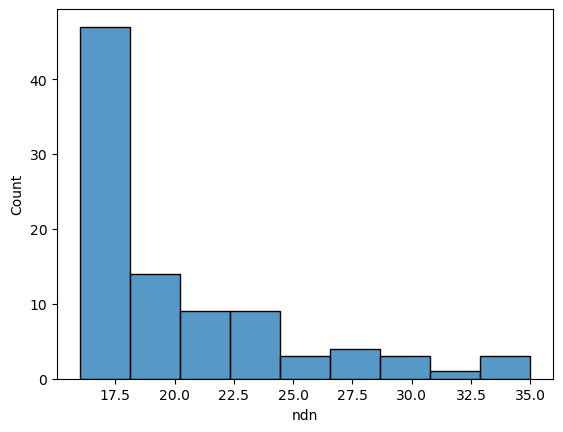

In [115]:
sns.histplot(t[1]['ndn'])

In [25]:
len(t)

4760

In [2]:
def determine_core(edge_list, cc_threshold=0):
    edge_df = pd.read_csv(path+edge_list, compression='infer').astype({'ProteinAid': 'str', 'ProteinBid':'str'})
    nodes = pd.concat([edge_df['ProteinAid'], edge_df['ProteinBid']]).unique()
    interaction_matrix = pd.DataFrame(columns=nodes, index=nodes)

    rows = np.array()
    cols = np.array()
    vals = np.array()
    for edge in edge_df.iterrows():
        edge = edge[1]
        interaction_matrix[edge.ProteinAid, edge.ProteinBid] = edge.PPV
    return interaction_matrix

t = determine_core('human_regulome_pd.gz')

/tmp/ipykernel_3674908/1330275412.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  interaction_matrix[edge.ProteinAid, edge.ProteinBid] = edge.PPV
/tmp/ipykernel_3674908/1330275412.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  interaction_matrix[edge.ProteinAid, edge.ProteinBid] = edge.PPV
/tmp/ipykernel_3674908/1330275412.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.c

KeyboardInterrupt: 